In [1]:
import pandas as pd
import numpy as np

In [2]:
#%%writefile "Automobile Price prediction 2.ipynb"
df = pd.read_csv(r'C:/Users/Ali/Downloads/Automobile.csv')
df.head()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    int64  
 1   normalized-losses  205 non-null    object 
 2   make               205 non-null    object 
 3   fuel-type          205 non-null    object 
 4   aspiration         205 non-null    object 
 5   num-of-doors       205 non-null    object 
 6   body-style         205 non-null    object 
 7   drive-wheels       205 non-null    object 
 8   engine-location    205 non-null    object 
 9   wheel-base         205 non-null    float64
 10  length             205 non-null    float64
 11  width              205 non-null    float64
 12  height             205 non-null    float64
 13  curb-weight        205 non-null    int64  
 14  engine-type        205 non-null    object 
 15  num-of-cylinders   205 non-null    object 
 16  engine-size        205 non

### Cleaning missing price values with mean() value.

In [3]:
df.price.replace('?',0, inplace=True)

In [4]:
df['price'] = pd.to_numeric(df['price'])

In [5]:
df.price.replace(0,df.price.mean(), inplace=True)

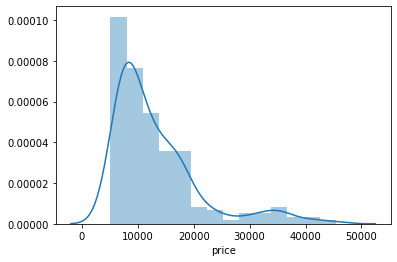

In [6]:
import seaborn as sns
sns.distplot(df.price)

### Cleaning Doors and Normalized loses

In [7]:
df[df['num-of-doors'] == '?']

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
27,1,148,dodge,gas,turbo,?,sedan,fwd,front,93.7,...,98,mpfi,3.03,3.39,7.6,102,5500,24,30,8558.0
63,0,?,mazda,diesel,std,?,sedan,fwd,front,98.8,...,122,idi,3.39,3.39,22.7,64,4650,36,42,10795.0


In [8]:
df['num-of-doors'].value_counts()

four    114
two      89
?         2
Name: num-of-doors, dtype: int64

In [9]:
df.loc[(df['num-of-doors'] == '?') , 'num-of-doors' ] = 'four' 

In [10]:
df[df['num-of-doors'] == '?']

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price


In [11]:
df['normalized-losses'].replace('?',0, inplace=True)

In [12]:
df['normalized-losses'] = pd.to_numeric(df['normalized-losses'])
df['normalized-losses'].unique()

array([  0, 164, 158, 192, 188, 121,  98,  81, 118, 148, 110, 145, 137,
       101,  78, 106,  85, 107, 104, 113, 150, 129, 115,  93, 142, 161,
       153, 125, 128, 122, 103, 168, 108, 194, 231, 119, 154,  74, 186,
        83, 102,  89,  87,  77,  91, 134,  65, 197,  90,  94, 256,  95],
      dtype=int64)

In [13]:
pd.pivot_table(data=df , index='body-style', values='normalized-losses', aggfunc= np.mean )

,normalized-losses
body-style,
convertible,46.000000
hardtop,82.875000
hatchback,113.214286
sedan,100.583333
wagon,59.520000


In [14]:
df.loc[(df['body-style'] == 'hatchback') & (df['normalized-losses'] == 0), 'normalized-losses'] = 113
df.loc[(df['body-style'] == 'convertible') & (df['normalized-losses'] == 0), 'normalized-losses'] = 46
df.loc[(df['body-style'] == 'sedan') & (df['normalized-losses'] == 0), 'normalized-losses'] = 100
df.loc[(df['body-style'] == 'wagon') & (df['normalized-losses'] == 0), 'normalized-losses'] = 59
df.loc[(df['body-style'] == 'hardtop') & (df['normalized-losses'] == 0), 'normalized-losses'] = 82

### Cleaning Stroke and Bore

In [15]:
df[(df['bore'] == '?')]

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
55,3,150,mazda,gas,std,two,hatchback,rwd,front,95.3,...,70,4bbl,?,?,9.4,101,6000,17,23,10945.0
56,3,150,mazda,gas,std,two,hatchback,rwd,front,95.3,...,70,4bbl,?,?,9.4,101,6000,17,23,11845.0
57,3,150,mazda,gas,std,two,hatchback,rwd,front,95.3,...,70,4bbl,?,?,9.4,101,6000,17,23,13645.0
58,3,150,mazda,gas,std,two,hatchback,rwd,front,95.3,...,80,mpfi,?,?,9.4,135,6000,16,23,15645.0


In [16]:
df['bore'].replace('?',0, inplace=True)
df['stroke'].replace('?',0, inplace=True)
df['stroke'] = pd.to_numeric(df['stroke'])
df['bore'] = pd.to_numeric(df['bore'])

In [17]:
df.loc[(df['bore'] == 0), 'bore' ] = 3.21

In [18]:
df.loc[(df['stroke'] == 0), 'stroke' ] = 3.27

### Cleaing peak-rpm and horsepower

In [19]:
df[df['peak-rpm'] == '?']

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
130,0,59,renault,gas,std,four,wagon,fwd,front,96.1,...,132,mpfi,3.46,3.9,8.7,?,?,23,31,9295.0
131,2,113,renault,gas,std,two,hatchback,fwd,front,96.1,...,132,mpfi,3.46,3.9,8.7,?,?,23,31,9895.0


In [20]:
df[df['horsepower'] == '?']

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
130,0,59,renault,gas,std,four,wagon,fwd,front,96.1,...,132,mpfi,3.46,3.9,8.7,?,?,23,31,9295.0
131,2,113,renault,gas,std,two,hatchback,fwd,front,96.1,...,132,mpfi,3.46,3.9,8.7,?,?,23,31,9895.0


In [21]:
df['peak-rpm'].replace('?', 0 , inplace=True)
df['horsepower'].replace('?', 0 , inplace=True)
df['peak-rpm'] = pd.to_numeric(df['peak-rpm'])
df['horsepower'] = pd.to_numeric(df['horsepower'])

In [22]:
#pd.pivot_table(data=df, index=['body-style','make'], values='peak-rpm', aggfunc=np.mean)
pd.pivot_table(data=df , index=['body-style','drive-wheels'], values= ['horsepower', 'peak-rpm'], aggfunc=np.mean)

horsepower     peak-rpm
body-style  drive-wheels                         
convertible fwd            90.000000  5500.000000
            rwd           140.000000  5090.000000
hardtop     fwd            69.000000  5200.000000
            rwd           152.714286  5007.142857
hatchback   4wd           116.500000  4950.000000
            fwd            83.061224  5079.591837
            rwd           141.526316  5381.578947
sedan       4wd           102.666667  5033.333333
            fwd            86.631579  5154.385965
            rwd           129.222222  4970.833333
wagon       4wd            79.250000  4800.000000
            fwd            81.500000  4783.333333
            rwd           116.777778  4861.111111

In [23]:
df.loc[(df['body-style'] == 'wagon') & (df['horsepower'] == 0), 'horsepower'] = 81
df.loc[(df['body-style'] == 'hatchback') & (df['horsepower'] == 0), 'horsepower'] = 83
df.loc[(df['body-style'] == 'wagon') & (df['peak-rpm'] == 0), 'peak-rpm'] = 4783
df.loc[(df['body-style'] == 'hatchback') & (df['peak-rpm'] == 0), 'peak-rpm'] = 5079

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    int64  
 1   normalized-losses  205 non-null    int64  
 2   make               205 non-null    object 
 3   fuel-type          205 non-null    object 
 4   aspiration         205 non-null    object 
 5   num-of-doors       205 non-null    object 
 6   body-style         205 non-null    object 
 7   drive-wheels       205 non-null    object 
 8   engine-location    205 non-null    object 
 9   wheel-base         205 non-null    float64
 10  length             205 non-null    float64
 11  width              205 non-null    float64
 12  height             205 non-null    float64
 13  curb-weight        205 non-null    int64  
 14  engine-type        205 non-null    object 
 15  num-of-cylinders   205 non-null    object 
 16  engine-size        205 non

In [25]:
### Cleaned Data
df.head(3)

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,46,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,46,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,113,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0


In [26]:
df.head()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,46,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,46,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,113,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [27]:
df.symboling.value_counts()

 0    67
 1    54
 2    32
 3    27
-1    22
-2     3
Name: symboling, dtype: int64

### Symboling is not impacting the price

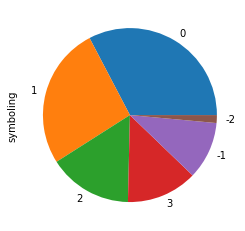

In [28]:
df.symboling.value_counts().plot.pie()

In [29]:
df.shape

(205, 26)

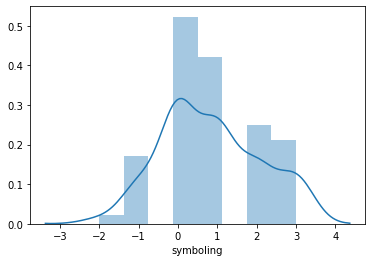

In [30]:
sns.distplot(df['symboling'])

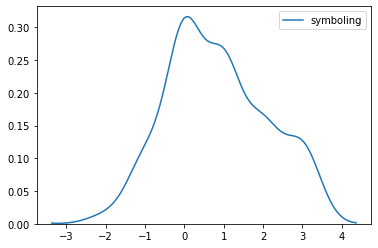

In [31]:
sns.kdeplot(df['symboling'])

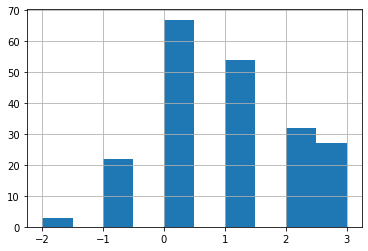

In [32]:
df['symboling'].hist()

count      205.000000
mean     13202.101059
std       7868.849339
min       5118.000000
25%       7788.000000
50%      10595.000000
75%      16500.000000
max      45400.000000
Name: price, dtype: float64


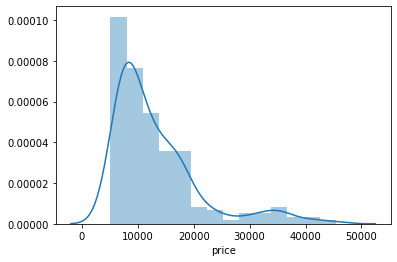

In [33]:
import matplotlib.pyplot as plt
print(df['price'].describe())
#plt.subplot(1,1,1)
#sns.boxplot(df['price'])
plt.subplot(1,1,1)
sns.distplot(df['price'])

1.8157911633011312


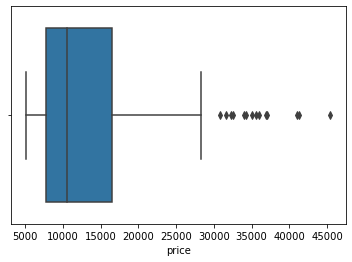

In [34]:
from scipy.stats import skew
from scipy.stats import kurtosis
print(skew(df['price']))
sns.boxplot(df['price'])

In [35]:
df['symboling'].corr(df['price'])

-0.08202828662064653

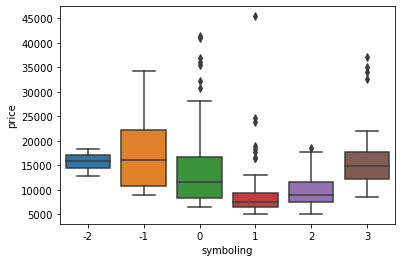

In [36]:
sns.boxplot(x=df['symboling'], y=df['price'])

### Normalized-loses have no correlation with price

count    205.000000
mean     115.317073
std       35.960653
min       46.000000
25%       93.000000
50%      106.000000
75%      137.000000
max      256.000000
Name: normalized-losses, dtype: float64


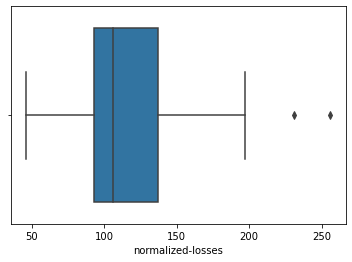

In [37]:
print(df['normalized-losses'].describe())
sns.boxplot(df['normalized-losses'])

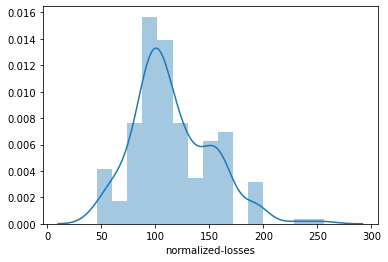

In [38]:
sns.distplot(df['normalized-losses'])

In [39]:
df['normalized-losses'].corr(df['price'])

-0.044157430115439184

### Model is impacting the price

toyota           32
nissan           18
mazda            17
mitsubishi       13
honda            13
subaru           12
volkswagen       12
peugot           11
volvo            11
dodge             9
mercedes-benz     8
bmw               8
plymouth          7
audi              7
saab              6
porsche           5
isuzu             4
jaguar            3
chevrolet         3
alfa-romero       3
renault           2
mercury           1
Name: make, dtype: int64
AxesSubplot(0.125,0.125;0.775x0.755)


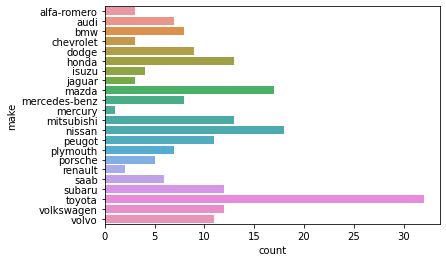

In [40]:
print(df['make'].value_counts())
print(sns.countplot(y=df['make']))

In [41]:
pd.pivot_table(data=df, index=df['make'], aggfunc={'price':'mean'}).sort_values(by='price')

,price
make,
chevrolet,6007.000000
dodge,7875.444444
plymouth,7963.428571
honda,8184.692308
subaru,8541.250000
mitsubishi,9239.769231
renault,9595.000000
toyota,9885.812500
volkswagen,10077.500000


### Fuel-type is not exactly impacting the price

In [42]:
print(df['fuel-type'].value_counts())
print(pd.pivot_table(data=df , index=df['fuel-type'], aggfunc={'price':'mean'}))

gas       185
diesel     20
Name: fuel-type, dtype: int64
                  price
fuel-type              
diesel     15838.150000
gas        12917.122795


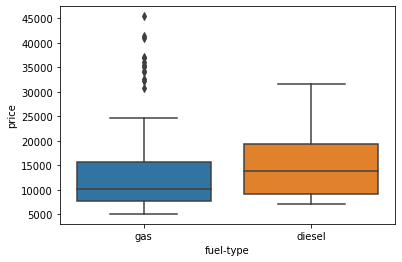

In [43]:
sns.boxplot(x=df['fuel-type'], y=df['price'])

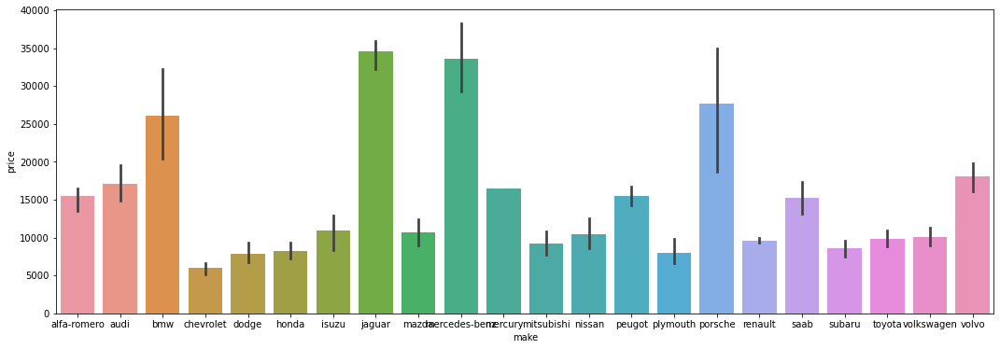

In [44]:
plt.figure(figsize=(18,6))
sns.barplot(x=df['make'], y=df['price'])

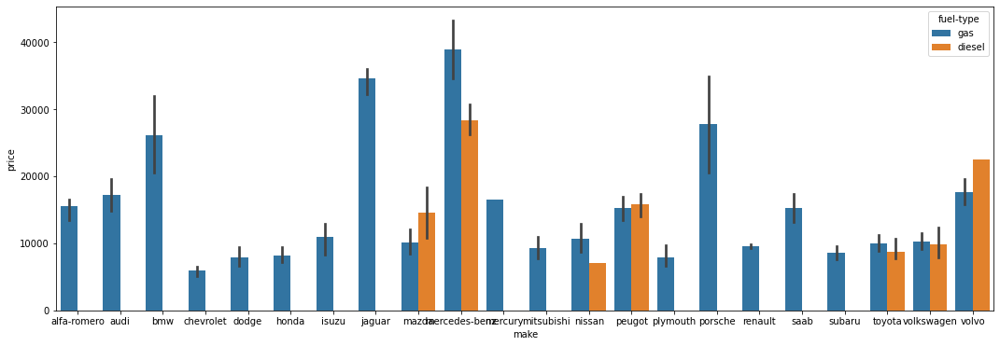

In [45]:
plt.figure(figsize=(18,6))
sns.barplot(x=df['make'], y=df['price'], hue=df['fuel-type'])

### Aspiration is impacting the price , even though it is less in count but what we are able to see is all those cars 
### that comes with turbo , all of those cars have higher prices that 'std' aspiration.

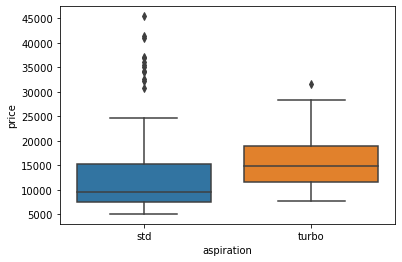

In [46]:
sns.boxplot(x=df['aspiration'], y=df['price'])

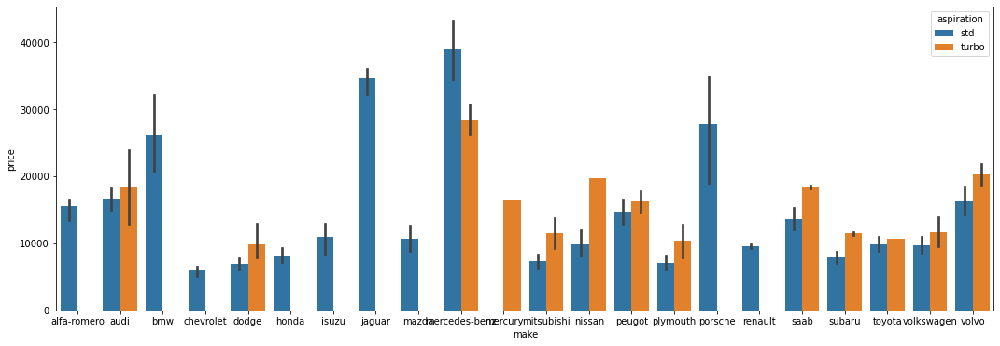

In [47]:
plt.figure(figsize=(18,6))
sns.barplot(x=df['make'], y=df['price'], hue=df['aspiration'])

### Num-of-doors is not actually impacting the price

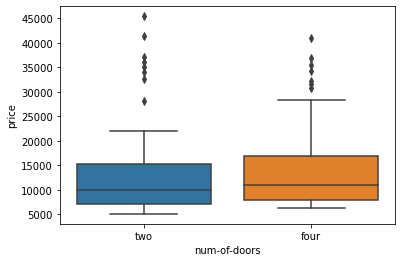

In [48]:
sns.boxplot(x=df['num-of-doors'], y=df['price'])

In [49]:
pd.pivot_table(data=df , index=df['num-of-doors'], aggfunc={'price':'mean'})

,price
num-of-doors,
four,13493.305425
two,12822.553796


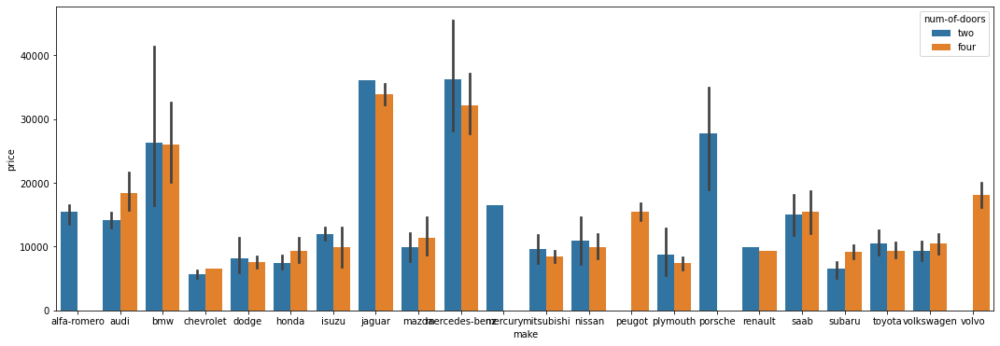

In [50]:
plt.figure(figsize=(18,6))
sns.barplot(x=df['make'], y=df['price'], hue=df['num-of-doors'])

### Body-style is impacting the price , but we can't include it ( indirectly it is not impacting ) . Incase if it looks like impacting then ( it is the reason of luxury cars )

In [51]:
print(df['body-style'].describe())

count       205
unique        5
top       sedan
freq         96
Name: body-style, dtype: object


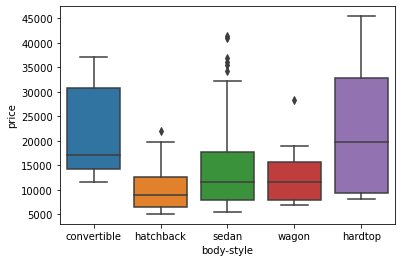

In [52]:
sns.boxplot(x=df['body-style'], y=df['price'])

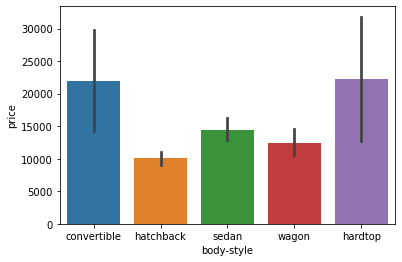

In [53]:
sns.barplot(x=df['body-style'], y=df['price'])

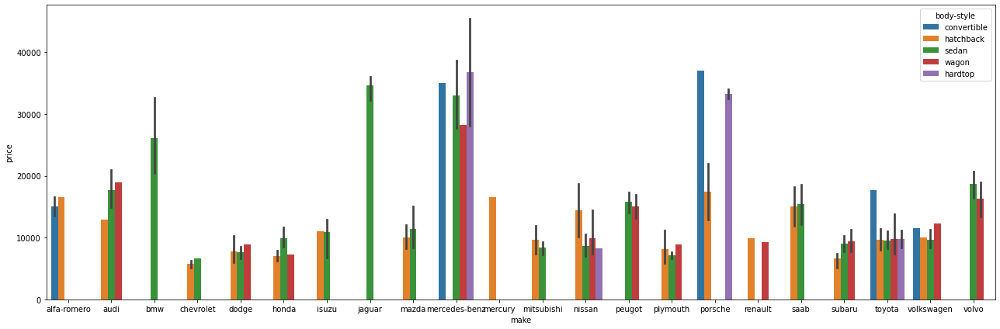

In [54]:
plt.figure(figsize=(18,6))
sns.barplot(x=df['make'], y=df['price'], hue=df['body-style'])
plt.tight_layout()

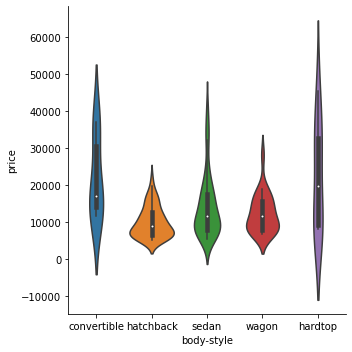

In [55]:
sns.catplot(x="body-style", y="price", data=df,kind='violin')

### Drive-wheels are impacting the price , it has no-multicollinearity with "make"/model but it is independently affecting the price . Specially "rwd" have much higher price

In [56]:
df['drive-wheels'].value_counts()

fwd    120
rwd     76
4wd      9
Name: drive-wheels, dtype: int64

In [57]:
pd.pivot_table(data=df , index=df['drive-wheels'], aggfunc={'price':'mean'})

,price
drive-wheels,
4wd,10541.936585
fwd,9306.523821
rwd,19668.031964


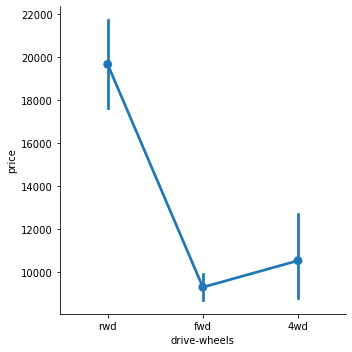

In [58]:
sns.catplot(x="drive-wheels", y="price", data=df, kind="point")

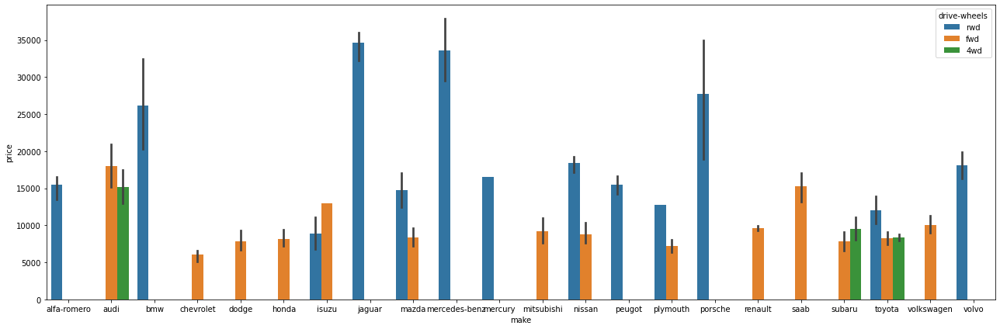

In [59]:
plt.figure(figsize=(18,6))
sns.barplot(x=df['make'], y=df['price'], hue=df['drive-wheels'])
plt.tight_layout()

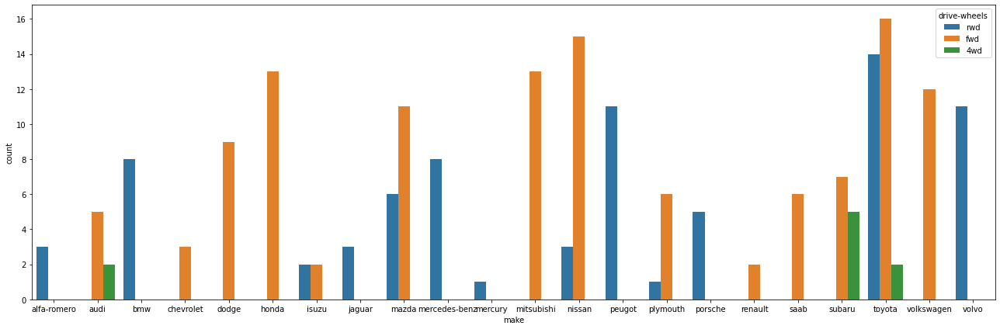

In [60]:
plt.figure(figsize=(18,6))
sns.countplot(x=df['make'], hue=df['drive-wheels'])
plt.tight_layout()

### Engine location has a great effect on price , but we have very less Data ( 3 rows ) . We can't include it.

In [61]:
pd.pivot_table(data=df , index=df['engine-location'], aggfunc={'price':'mean'})

,price
engine-location,
front,12885.379787
rear,34528.000000


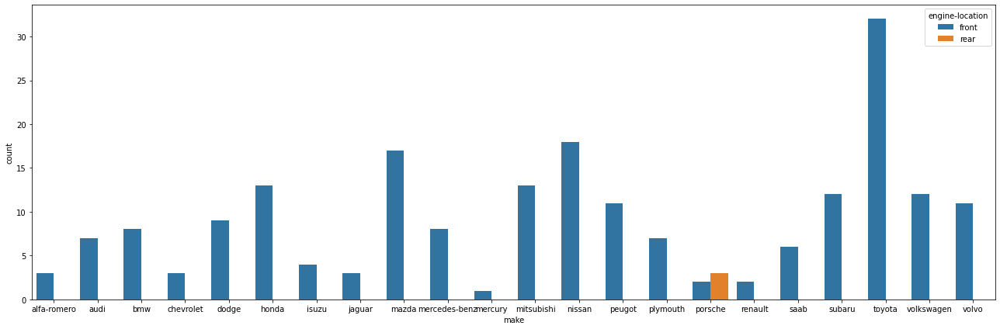

In [62]:
plt.figure(figsize=(18,6))
sns.countplot(x=df['make'], hue=df['engine-location'])
plt.tight_layout()

### wheel-base have a moderate relationship with price . But we have to check multicolinearity for it. 

In [63]:
df['wheel-base'].corr(df['price'])

0.5833787801218879

count    205.000000
mean      98.756585
std        6.021776
min       86.600000
25%       94.500000
50%       97.000000
75%      102.400000
max      120.900000
Name: wheel-base, dtype: float64


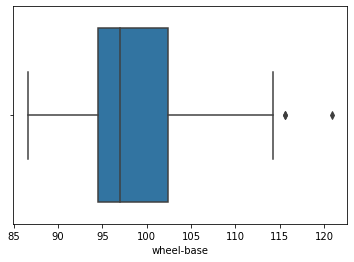

In [64]:
print(df['wheel-base'].describe())
sns.boxplot(df['wheel-base'])

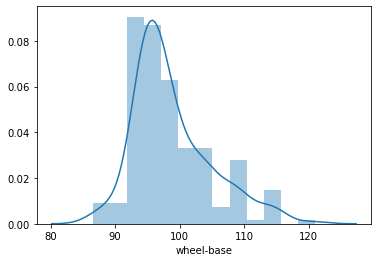

In [65]:
sns.distplot(df['wheel-base'])

In [66]:
pd.pivot_table(data=df , index=df['make'], aggfunc={'wheel-base':'mean'}).sort_values(by= 'wheel-base')

,wheel-base
make,
alfa-romero,90.566667
porsche,92.280000
chevrolet,92.466667
honda,94.330769
isuzu,94.825000
dodge,95.011111
mitsubishi,95.353846
plymouth,95.385714
nissan,95.722222


### Length , width have good correlation with price , But again check for Multi-collinearity.

In [67]:
print(df['length'].corr(df['price']))
print(df['width'].corr(df['price']))
print(df['height'].corr(df['price']))

0.6833760904696906
0.7284092682629841
0.1349379704094241


In [68]:
### Lenght
print(df['length'].corr(df['wheel-base']))
print(df['length'].corr(df['curb-weight']))
print(df['length'].corr(df['width']))

0.874587475964263
0.8777284608306428
0.841118268481846


### Curb-wheigth also have very strong relationship with price

In [69]:
print(df['curb-weight'].corr(df['price']))

0.8208225184242933


In [70]:
print(df['engine-size'].corr(df['price']))
print(df['horsepower'].corr(df['price']))
print(df['engine-size'].corr(df['horsepower']))

0.8617187994441236
0.7585856708020676
0.8087905437023719


In [71]:
df['bore'].value_counts()

3.62    23
3.19    20
3.15    15
2.97    12
3.03    12
3.46     9
3.78     8
3.31     8
3.43     8
3.27     7
2.91     7
3.39     6
3.05     6
3.54     6
3.58     6
3.01     5
3.70     5
3.21     4
3.35     4
3.74     3
3.59     3
3.17     3
3.13     2
3.24     2
3.63     2
3.80     2
3.94     2
3.47     2
3.33     2
3.50     2
2.92     1
3.61     1
3.08     1
2.99     1
3.76     1
2.68     1
3.34     1
3.60     1
2.54     1
Name: bore, dtype: int64

### Engine-type is also affecting

In [72]:
df['engine-type'].value_counts()

ohc      148
ohcf      15
ohcv      13
l         12
dohc      12
rotor      4
dohcv      1
Name: engine-type, dtype: int64

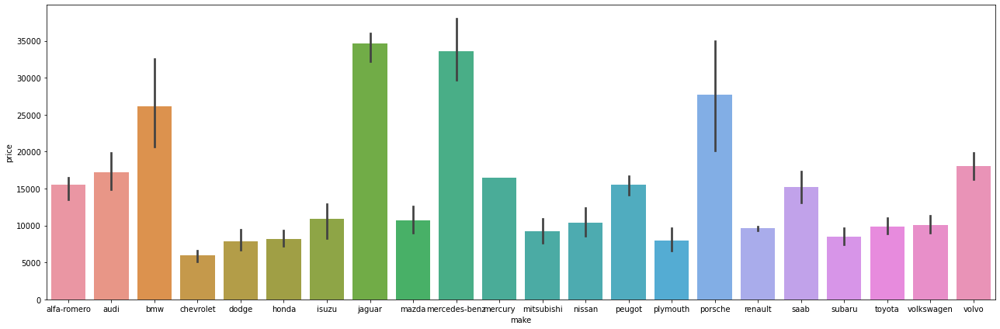

In [73]:
plt.figure(figsize=(18,6))
sns.barplot(x=df['make'],y=df['price'])
plt.tight_layout()

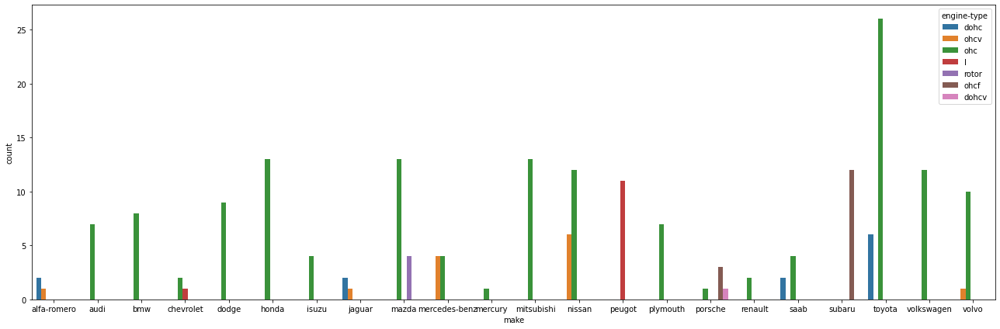

In [74]:
plt.figure(figsize=(18,6))
sns.countplot(x=df['make'], hue=df['engine-type'])
plt.tight_layout()

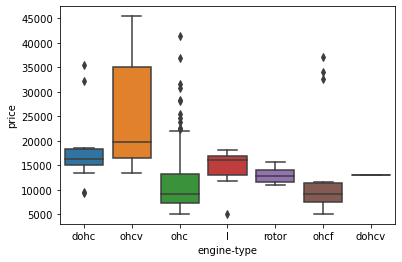

In [75]:
sns.boxplot(x=df['engine-type'], y=df['price'])

### Num-of-cylinders also effect the price

In [76]:
df['num-of-cylinders'].value_counts()

four      159
six        24
five       11
eight       5
two         4
three       1
twelve      1
Name: num-of-cylinders, dtype: int64

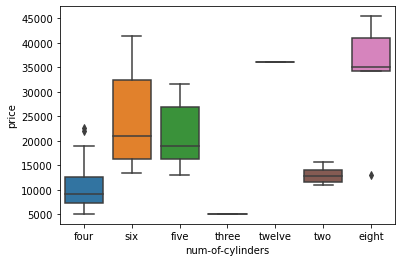

In [77]:
sns.boxplot(x=df['num-of-cylinders'], y=df['price'])

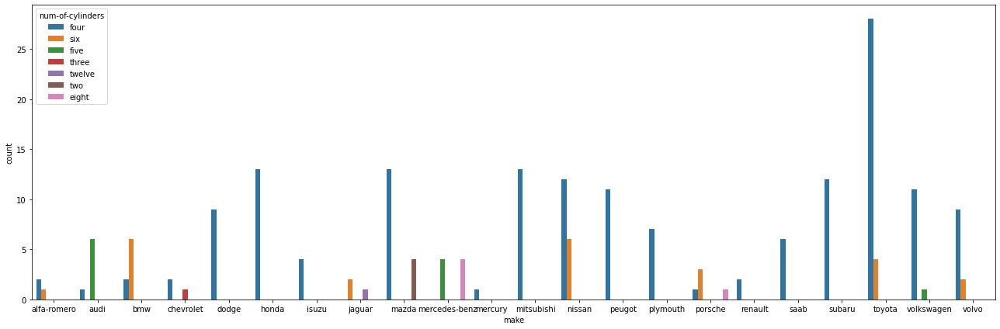

In [78]:
plt.figure(figsize=(18,6))
sns.countplot(x=df['make'], hue=df['num-of-cylinders'])
plt.tight_layout()

### You can have fuel-system

In [79]:
df['fuel-system'].value_counts()

mpfi    94
2bbl    66
idi     20
1bbl    11
spdi     9
4bbl     3
spfi     1
mfi      1
Name: fuel-system, dtype: int64

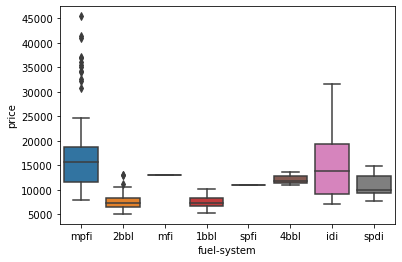

In [80]:
sns.boxplot(x=df['fuel-system'], y=df['price'])

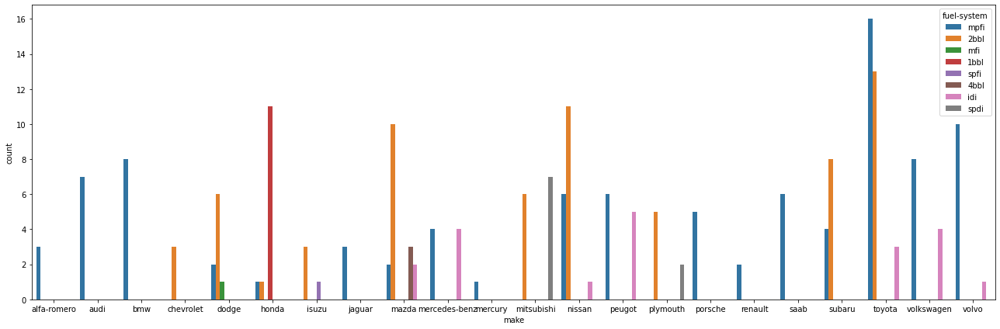

In [81]:
plt.figure(figsize=(18,6))
sns.countplot(x=df['make'], hue=df['fuel-system'])
plt.tight_layout()

# Linear regression Model

In [82]:
df.dtypes =='int64'

symboling             True
normalized-losses     True
make                 False
fuel-type            False
aspiration           False
num-of-doors         False
body-style           False
drive-wheels         False
engine-location      False
wheel-base           False
length               False
width                False
height               False
curb-weight           True
engine-type          False
num-of-cylinders     False
engine-size           True
fuel-system          False
bore                 False
stroke               False
compression-ratio    False
horsepower            True
peak-rpm              True
city-mpg              True
highway-mpg           True
price                False
dtype: bool

In [85]:
df2['make']

0      alfa-romero
1      alfa-romero
2      alfa-romero
3             audi
4             audi
          ...     
200          volvo
201          volvo
202          volvo
203          volvo
204          volvo
Name: make, Length: 205, dtype: object

1. I've encoded 'make' column using Sklearn
2. I've encoded 'aspiration' column through replace.
3. I've encoded 'drive-wheels' column through replace.

In [62]:
import sklearn

In [87]:
df2 = df.loc[:,['make','aspiration','drive-wheels','engine-type','num-of-cylinders','fuel-system',
          'wheel-base','length','width','curb-weight','engine-size','horsepower','city-mpg','price']]
print(df.shape)
df2

(205, 26)


,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,wheel-base,length,width,curb-weight,engine-size,horsepower,city-mpg,price
0,0,std,rwd,dohc,four,mpfi,88.6,168.8,64.1,2548,130,111,21,13495.0
1,0,std,rwd,dohc,four,mpfi,88.6,168.8,64.1,2548,130,111,21,16500.0
2,0,std,rwd,ohcv,six,mpfi,94.5,171.2,65.5,2823,152,154,19,16500.0
3,1,std,fwd,ohc,four,mpfi,99.8,176.6,66.2,2337,109,102,24,13950.0
4,1,std,4wd,ohc,five,mpfi,99.4,176.6,66.4,2824,136,115,18,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,21,std,rwd,ohc,four,mpfi,109.1,188.8,68.9,2952,141,114,23,16845.0
201,21,turbo,rwd,ohc,four,mpfi,109.1,188.8,68.8,3049,141,160,19,19045.0
202,21,std,rwd,ohcv,six,mpfi,109.1,188.8,68.9,3012,173,134,18,21485.0
203,21,turbo,rwd,ohc,six,idi,109.1,188.8,68.9,3217,145,106,26,22470.0


In [88]:
#Encoding
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
encoded = label_encoder.fit(df2['make'])
df2['make'] = encoded.transform(df['make'])


In [89]:
df2['aspiration'].replace(to_replace=['std','turbo'], value=[0,1], inplace=True)
df2

,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,wheel-base,length,width,curb-weight,engine-size,horsepower,city-mpg,price
0,0,0,rwd,dohc,four,mpfi,88.6,168.8,64.1,2548,130,111,21,13495.0
1,0,0,rwd,dohc,four,mpfi,88.6,168.8,64.1,2548,130,111,21,16500.0
2,0,0,rwd,ohcv,six,mpfi,94.5,171.2,65.5,2823,152,154,19,16500.0
3,1,0,fwd,ohc,four,mpfi,99.8,176.6,66.2,2337,109,102,24,13950.0
4,1,0,4wd,ohc,five,mpfi,99.4,176.6,66.4,2824,136,115,18,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,21,0,rwd,ohc,four,mpfi,109.1,188.8,68.9,2952,141,114,23,16845.0
201,21,1,rwd,ohc,four,mpfi,109.1,188.8,68.8,3049,141,160,19,19045.0
202,21,0,rwd,ohcv,six,mpfi,109.1,188.8,68.9,3012,173,134,18,21485.0
203,21,1,rwd,ohc,six,idi,109.1,188.8,68.9,3217,145,106,26,22470.0


In [90]:
print(df2['drive-wheels'].unique())
df2['drive-wheels'].replace(to_replace=['rwd','fwd','4wd'], value=[0,1,2], inplace=True)
df2

['rwd' 'fwd' '4wd']


,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,wheel-base,length,width,curb-weight,engine-size,horsepower,city-mpg,price
0,0,0,0,dohc,four,mpfi,88.6,168.8,64.1,2548,130,111,21,13495.0
1,0,0,0,dohc,four,mpfi,88.6,168.8,64.1,2548,130,111,21,16500.0
2,0,0,0,ohcv,six,mpfi,94.5,171.2,65.5,2823,152,154,19,16500.0
3,1,0,1,ohc,four,mpfi,99.8,176.6,66.2,2337,109,102,24,13950.0
4,1,0,2,ohc,five,mpfi,99.4,176.6,66.4,2824,136,115,18,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,21,0,0,ohc,four,mpfi,109.1,188.8,68.9,2952,141,114,23,16845.0
201,21,1,0,ohc,four,mpfi,109.1,188.8,68.8,3049,141,160,19,19045.0
202,21,0,0,ohcv,six,mpfi,109.1,188.8,68.9,3012,173,134,18,21485.0
203,21,1,0,ohc,six,idi,109.1,188.8,68.9,3217,145,106,26,22470.0


In [91]:
print(df2['engine-type'].unique())
df2['engine-type'].replace(to_replace=['dohc','ohcv','ohc','l','rotor','ohcf','dohcv'], value=[0,1,2,3,4,5,6], inplace=True)
df2

['dohc' 'ohcv' 'ohc' 'l' 'rotor' 'ohcf' 'dohcv']


,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,wheel-base,length,width,curb-weight,engine-size,horsepower,city-mpg,price
0,0,0,0,0,four,mpfi,88.6,168.8,64.1,2548,130,111,21,13495.0
1,0,0,0,0,four,mpfi,88.6,168.8,64.1,2548,130,111,21,16500.0
2,0,0,0,1,six,mpfi,94.5,171.2,65.5,2823,152,154,19,16500.0
3,1,0,1,2,four,mpfi,99.8,176.6,66.2,2337,109,102,24,13950.0
4,1,0,2,2,five,mpfi,99.4,176.6,66.4,2824,136,115,18,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,21,0,0,2,four,mpfi,109.1,188.8,68.9,2952,141,114,23,16845.0
201,21,1,0,2,four,mpfi,109.1,188.8,68.8,3049,141,160,19,19045.0
202,21,0,0,1,six,mpfi,109.1,188.8,68.9,3012,173,134,18,21485.0
203,21,1,0,2,six,idi,109.1,188.8,68.9,3217,145,106,26,22470.0


In [92]:
print(df2['num-of-cylinders'].unique())
df2['num-of-cylinders'].replace(to_replace=['four','six','five','three','twelve','two','eight'], value=[0,1,2,3,4,5,6], inplace=True)
df2

['four' 'six' 'five' 'three' 'twelve' 'two' 'eight']


,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,wheel-base,length,width,curb-weight,engine-size,horsepower,city-mpg,price
0,0,0,0,0,0,mpfi,88.6,168.8,64.1,2548,130,111,21,13495.0
1,0,0,0,0,0,mpfi,88.6,168.8,64.1,2548,130,111,21,16500.0
2,0,0,0,1,1,mpfi,94.5,171.2,65.5,2823,152,154,19,16500.0
3,1,0,1,2,0,mpfi,99.8,176.6,66.2,2337,109,102,24,13950.0
4,1,0,2,2,2,mpfi,99.4,176.6,66.4,2824,136,115,18,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,21,0,0,2,0,mpfi,109.1,188.8,68.9,2952,141,114,23,16845.0
201,21,1,0,2,0,mpfi,109.1,188.8,68.8,3049,141,160,19,19045.0
202,21,0,0,1,1,mpfi,109.1,188.8,68.9,3012,173,134,18,21485.0
203,21,1,0,2,1,idi,109.1,188.8,68.9,3217,145,106,26,22470.0


In [93]:
print(df2['fuel-system'].unique())
df2['fuel-system'].replace(to_replace=['mpfi','2bbl','mfi','1bbl','spfi','4bbl','idi','spdi'], value=[0,1,2,3,4,5,6,7], inplace=True)
df2

['mpfi' '2bbl' 'mfi' '1bbl' 'spfi' '4bbl' 'idi' 'spdi']


,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,wheel-base,length,width,curb-weight,engine-size,horsepower,city-mpg,price
0,0,0,0,0,0,0,88.6,168.8,64.1,2548,130,111,21,13495.0
1,0,0,0,0,0,0,88.6,168.8,64.1,2548,130,111,21,16500.0
2,0,0,0,1,1,0,94.5,171.2,65.5,2823,152,154,19,16500.0
3,1,0,1,2,0,0,99.8,176.6,66.2,2337,109,102,24,13950.0
4,1,0,2,2,2,0,99.4,176.6,66.4,2824,136,115,18,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,21,0,0,2,0,0,109.1,188.8,68.9,2952,141,114,23,16845.0
201,21,1,0,2,0,0,109.1,188.8,68.8,3049,141,160,19,19045.0
202,21,0,0,1,1,0,109.1,188.8,68.9,3012,173,134,18,21485.0
203,21,1,0,2,1,6,109.1,188.8,68.9,3217,145,106,26,22470.0


In [94]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   make              205 non-null    int64  
 1   aspiration        205 non-null    int64  
 2   drive-wheels      205 non-null    int64  
 3   engine-type       205 non-null    int64  
 4   num-of-cylinders  205 non-null    int64  
 5   fuel-system       205 non-null    int64  
 6   wheel-base        205 non-null    float64
 7   length            205 non-null    float64
 8   width             205 non-null    float64
 9   curb-weight       205 non-null    int64  
 10  engine-size       205 non-null    int64  
 11  horsepower        205 non-null    int64  
 12  city-mpg          205 non-null    int64  
 13  price             205 non-null    float64
dtypes: float64(4), int64(10)
memory usage: 22.5 KB


In [95]:
df2.drop(columns={'length'}, inplace=True)
df2.drop(columns={'wheel-base'}, inplace=True)
df2.drop(columns={'curb-weight'}, inplace=True)
df2.drop(columns={'city-mpg'}, inplace=True)
df2.drop(columns={'engine-size'}, inplace=True)
df2.drop(columns={'width'}, inplace=True)
df2.columns

Index(['make', 'aspiration', 'drive-wheels', 'engine-type', 'num-of-cylinders',
       'fuel-system', 'horsepower', 'price'],
      dtype='object')

In [96]:
### Checking Multicolinearity
import numpy as np
X = np.array(df2)
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif = [variance_inflation_factor(X, i) for i in range(X.shape[1])]
print(vif)
X = pd.DataFrame(X)

[4.691924063212858, 1.821411981415019, 2.6769569317513913, 5.171687526626861, 1.8420914559984707, 1.9545003822249565, 16.317000196318475, 10.822313385277086]


In [97]:
df2.columns

Index(['make', 'aspiration', 'drive-wheels', 'engine-type', 'num-of-cylinders',
       'fuel-system', 'horsepower', 'price'],
      dtype='object')

In [29]:
import pandas_profiling as pp
pp.ProfileReport(df)

In [96]:
print(df2['curb-weight'].corr(df2['engine-size']))
print(df2['curb-weight'].corr(df2['horsepower']))
print(df2['engine-size'].corr(df2['curb-weight']))
print(df2['horsepower'].corr(df2['city-mpg']))

0.8505940734262771
0.7501660660751399
0.8505940734262771
-0.8000556751219319


In [103]:
print(df2['width'].corr(df2['engine-size']))
print(df2['width'].corr(df2['horsepower']))


0.7354334047796369
0.6395624522364237


In [104]:
print(df2['engine-size'].corr(df2['horsepower']))

0.8087905437023719


In [111]:
#df2.to_csv('C:/Users/Ali/Downloads/clevelanda.csv')

In [98]:
df2.head()

,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,horsepower,price
0,0,0,0,0,0,0,111,13495.0
1,0,0,0,0,0,0,111,16500.0
2,0,0,0,1,1,0,154,16500.0
3,1,0,1,2,0,0,102,13950.0
4,1,0,2,2,2,0,115,17450.0


In [116]:
### Before Standardization , the data looks like as follos

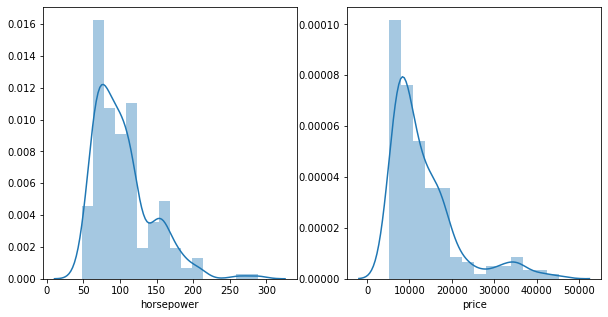

In [109]:
fig, axes = plt.subplots(1,2, figsize=(10,5))
sns.distplot(df2['horsepower'], ax=axes[0])
sns.distplot(df2['price'], ax=axes[1])

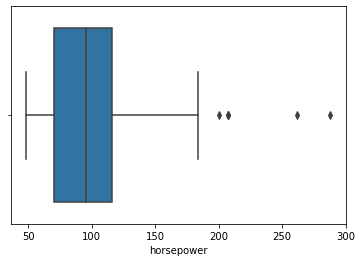

In [111]:
sns.boxplot(df['horsepower'])

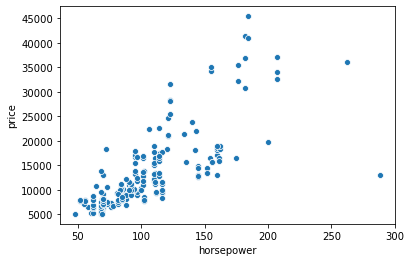

In [110]:
sns.scatterplot(x=df2['horsepower'], y=df2['price'])

In [103]:
#Feature Scaling
from sklearn.preprocessing import Normalizer

auto_n = Normalizer().fit_transform(df2.iloc[:,6:])
auto_n = pd.DataFrame(auto_n)
print(auto_n)

            0         1
0    0.008225  0.999966
1    0.006727  0.999977
2    0.009333  0.999956
3    0.007312  0.999973
4    0.006590  0.999978
..        ...       ...
200  0.006767  0.999977
201  0.008401  0.999965
202  0.006237  0.999981
203  0.004717  0.999989
204  0.005039  0.999987

[205 rows x 2 columns]


In [117]:
### Standardizing the values

In [115]:
from sklearn.preprocessing import StandardScaler
st = StandardScaler().fit_transform(df2.iloc[:,6:])
st = pd.DataFrame(st)
print(st)

            0         1
0    0.176301  0.037314
1    0.176301  0.420134
2    1.265364  0.420134
3   -0.051642  0.095278
4    0.277609  0.541159
..        ...       ...
200  0.252282  0.464085
201  1.417326  0.744353
202  0.758823  1.055196
203  0.049666  1.180679
204  0.252282  1.200425

[205 rows x 2 columns]


In [120]:
df2 = pd.concat([df2,st], axis=1)
df2

,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,horsepower,price,0,1
0,0,0,0,0,0,0,111,13495.0,0.176301,0.037314
1,0,0,0,0,0,0,111,16500.0,0.176301,0.420134
2,0,0,0,1,1,0,154,16500.0,1.265364,0.420134
3,1,0,1,2,0,0,102,13950.0,-0.051642,0.095278
4,1,0,2,2,2,0,115,17450.0,0.277609,0.541159
...,...,...,...,...,...,...,...,...,...,...
200,21,0,0,2,0,0,114,16845.0,0.252282,0.464085
201,21,1,0,2,0,0,160,19045.0,1.417326,0.744353
202,21,0,0,1,1,0,134,21485.0,0.758823,1.055196
203,21,1,0,2,1,6,106,22470.0,0.049666,1.180679


In [123]:
#df2.drop(columns={'horsepower','price'}, inplace=True)
df2.head(3)

,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,0,1
0,0,0,0,0,0,0,0.176301,0.037314
1,0,0,0,0,0,0,0.176301,0.420134
2,0,0,0,1,1,0,1.265364,0.420134


In [129]:
df2.rename(columns={0:'horsepower',1:'price'}, inplace=True)
df2

,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,horsepower,price
0,0,0,0,0,0,0,0.176301,0.037314
1,0,0,0,0,0,0,0.176301,0.420134
2,0,0,0,1,1,0,1.265364,0.420134
3,1,0,1,2,0,0,-0.051642,0.095278
4,1,0,2,2,2,0,0.277609,0.541159
...,...,...,...,...,...,...,...,...
200,21,0,0,2,0,0,0.252282,0.464085
201,21,1,0,2,0,0,1.417326,0.744353
202,21,0,0,1,1,0,0.758823,1.055196
203,21,1,0,2,1,6,0.049666,1.180679


In [125]:
### After standardization, the Data looks like as follos:

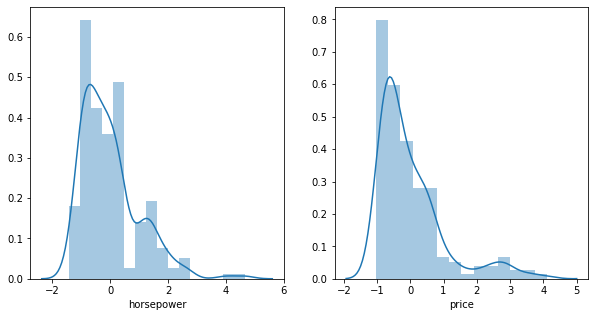

In [130]:
fig, axes = plt.subplots(1,2, figsize=(10,5))
sns.distplot(df2['horsepower'], ax=axes[0])
sns.distplot(df2['price'], ax=axes[1])

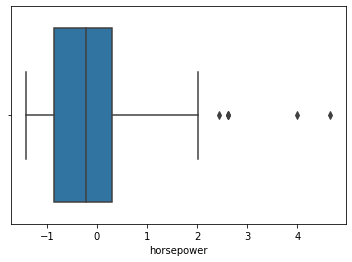

In [132]:
sns.boxplot(df2['horsepower'])

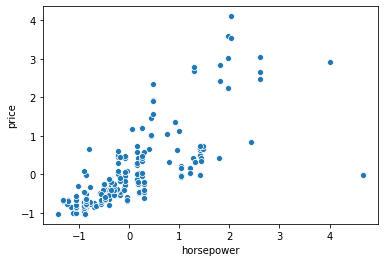

In [133]:
sns.scatterplot(x=df2['horsepower'], y=df2['price'])

In [134]:
df2.head(2)

,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,horsepower,price
0,0,0,0,0,0,0,0.176301,0.037314
1,0,0,0,0,0,0,0.176301,0.420134


### All set for Machine Learning

In [152]:
X = df2.iloc[:,:7]
print(X.head())
y = df2.iloc[:,7:]
print(y.head())

   make  aspiration  drive-wheels  engine-type  num-of-cylinders  fuel-system  \
0     0           0             0            0                 0            0   
1     0           0             0            0                 0            0   
2     0           0             0            1                 1            0   
3     1           0             1            2                 0            0   
4     1           0             2            2                 2            0   

   horsepower  
0    0.176301  
1    0.176301  
2    1.265364  
3   -0.051642  
4    0.277609  
      price
0  0.037314
1  0.420134
2  0.420134
3  0.095278
4  0.541159


In [153]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y, test_size = 0.2)

In [154]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(164, 7)
(164, 1)
(41, 7)
(41, 1)


In [155]:
from sklearn import linear_model #Parametric Model
from sklearn.tree import DecisionTreeRegressor #Non-Parametric Model

In [156]:
regr = linear_model.LinearRegression()
#regr = DecisionTreeRegressor()

In [157]:
#Training
regr.fit(X_train, y_train) 

LinearRegression()

In [158]:
# The coefficients
print('Coefficients', regr.coef_)
print('Intercept',regr.intercept_)

Coefficients [[-0.01170056  0.33544175 -0.43012198 -0.07492199  0.1908517  -0.01770425
   0.42038279]]
Intercept [0.45215739]


In [159]:
y_pred = regr.predict(X_test) #Transforming/predicting values based on "Testing/new Input Data"
y_pred2 = regr.predict(X_train)

In [143]:
y_pred

array([[-0.50493475],
       [-0.7323316 ],
       [ 0.33099737],
       [ 0.08418935],
       [-0.72286851],
       [ 1.34630885],
       [-0.55907202],
       [-1.38065994],
       [ 0.26880933],
       [-0.49563534],
       [-0.50354107],
       [ 1.06403728],
       [-0.4632932 ],
       [-0.64538324],
       [-0.59094073],
       [-0.88889776],
       [ 0.26880933],
       [-0.67645104],
       [-0.82151176],
       [-0.40528464],
       [-0.7323316 ],
       [ 1.4838254 ],
       [ 3.88085934],
       [-0.30225733],
       [ 0.09424167],
       [ 0.2056824 ],
       [ 0.6361077 ],
       [-0.49563534],
       [-0.78599543],
       [-1.042456  ],
       [-0.86649118],
       [-0.15144773],
       [ 4.92656665],
       [-0.51312349],
       [ 0.22466802],
       [ 1.08220432],
       [ 0.83996636],
       [ 2.07282019],
       [-0.88889776],
       [-0.5867597 ],
       [-0.87711979]])

In [160]:
#Evaluation : accuracy is 62%
from sklearn.metrics import mean_squared_error, r2_score
print(r2_score(y_test, y_pred)) #Coefficient of Determination

0.6294566516729251


In [161]:
#Evaluation : accuracy is 66%
from sklearn.metrics import mean_squared_error, r2_score
print(r2_score(y_train, y_pred2)) #Coefficient of Determination

0.6640658694169426


In [162]:
print(X_train.head(2))
print(y_train.head(2))

    make  aspiration  drive-wheels  engine-type  num-of-cylinders  \
35     5           0             1            2                 0   
94    12           0             1            2                 0   

    fuel-system  horsepower  
35            3   -0.710146  
94            1   -0.887435  
       price
35 -0.752532
94 -0.752023


### Let us try with decision tree

In [163]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(164, 7)
(164, 1)
(41, 7)
(41, 1)


In [164]:
regrr = DecisionTreeRegressor()
regrr.fit(X_train,y_train)

DecisionTreeRegressor()

In [165]:
# Desion-Tree is non-parametric model that's why it is throwing error as it does'nt have any "m" and "c" values stuff .
print('Coefficients', regrr.coef_)
print('Intercept',regrr.intercept_)

AttributeError: 'DecisionTreeRegressor' object has no attribute 'coef_'

In [166]:
y_predr = regrr.predict(X_train)
y_predr2 = regrr.predict(X_test)

### Now here decision-Tree is performing well , it is learning 98% and the Output is also 92% accurate results.

In [168]:
#Evaluation
from sklearn.metrics import mean_squared_error, r2_score
print(r2_score(y_train, y_predr)) #Coefficient of Determination
print(r2_score(y_test, y_predr2)) #Coefficient of Determination

0.9814622547437974
0.9242801668372218


In [169]:
df2.head(3)

,make,aspiration,drive-wheels,engine-type,num-of-cylinders,fuel-system,horsepower,price
0,0,0,0,0,0,0,0.176301,0.037314
1,0,0,0,0,0,0,0.176301,0.420134
2,0,0,0,1,1,0,1.265364,0.420134
